# Output Viewer

`outputs/` の中から見たい run フォルダを選んで、保存済みの数値データと図を確認するノートブックです。

使い方:
1. 次のセルを実行して run 一覧を確認する
2. `SELECTED_RUNS` に見たいフォルダ名を入れる
3. 残りのセルを上から実行する

In [231]:
from pathlib import Path
import json
import base64
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from scipy.optimize import curve_fit
from IPython.display import display, Markdown, Image, HTML

OUTPUTS_DIR = Path("outputs")
def load_json(path):
    if not path.exists():
        return None
    return json.loads(path.read_text())


def run_figures_dir(run_dir):
    figures_dir = run_dir / "figures"
    figures_dir.mkdir(parents=True, exist_ok=True)
    return figures_dir


def save_notebook_figure(fig, output_path):
    output_path = Path(output_path)
    output_path.parent.mkdir(parents=True, exist_ok=True)
    fig.savefig(output_path, dpi=300, bbox_inches="tight", transparent=False)
    print(f"saved: {output_path}")

run_dirs = sorted([p for p in OUTPUTS_DIR.iterdir() if p.is_dir() and (p / "config.json").exists()]) if OUTPUTS_DIR.exists() else []


display(Markdown("## Available runs"))
if not run_dirs:
    print("outputs/ に run フォルダがありません。")
else:
    for i, run_dir in enumerate(run_dirs):
        print(f"{i}: {run_dir.name}")


## Available runs

0: 20260512_123942_chi_plus_wh_L100
1: 20260512_152715_WH_chi_plus_L100
2: 20260512_155946_WH_chi_plus_L100
3: 20260512_160249_WH_chi_plus_L100
4: 20260512_160538_BH_chi_plus_L100
5: 20260512_160904_BH_chi_plus_L300
6: 20260512_160950_BH_chi_plus_L100
7: 20260512_161200_WH_chi_plus_L100
8: 20260512_161340_BH_chi_minus_L100
9: 20260512_162613_BH_chi_minus_L100
10: 20260512_164200_BH_chi_plus_L100
11: 20260512_165104_BH_chi_plus_L100
12: 20260512_170004_BH_chi_plus_L100
13: 20260512_171934_WH_chi_plus_L100
14: 20260512_180756_BH_chi_minus_L100
15: 20260512_181909_BH_chi_minus_L100
16: 20260512_182211_BH_chi_minus_L100
17: 20260512_185337_BH_chi_minus_L100


## Select Runs

`SELECTED_RUNS` に表示したい run フォルダ名を入れてください。空リスト `[]` の場合は `RUN_OFFSET_FROM_LATEST` で最新から何個前の run を開くか指定します。

- `RUN_OFFSET_FROM_LATEST = 0`: 最新
- `RUN_OFFSET_FROM_LATEST = 1`: 1つ前
- `RUN_OFFSET_FROM_LATEST = n`: n個前


In [232]:
SELECTED_RUNS = []
# 例:
# SELECTED_RUNS = ["20260512_123942_chi_plus_wh_L100"]

RUN_OFFSET_FROM_LATEST = 0
# 例:
# RUN_OFFSET_FROM_LATEST = 1  # 1つ前の run

if SELECTED_RUNS:
    selected_run_dirs = [OUTPUTS_DIR / name for name in SELECTED_RUNS]
else:
    if not run_dirs:
        selected_run_dirs = []
    else:
        if RUN_OFFSET_FROM_LATEST < 0:
            raise ValueError("RUN_OFFSET_FROM_LATEST must be >= 0")
        if RUN_OFFSET_FROM_LATEST >= len(run_dirs):
            raise ValueError(f"RUN_OFFSET_FROM_LATEST={RUN_OFFSET_FROM_LATEST} ですが run は {len(run_dirs)} 個しかありません。")
        selected_run_dirs = [run_dirs[-1 - RUN_OFFSET_FROM_LATEST]]

missing = [p for p in selected_run_dirs if not p.exists()]
if missing:
    raise FileNotFoundError("存在しない run フォルダ: " + ", ".join(str(p) for p in missing))

print("Selected runs:")
for run_dir in selected_run_dirs:
    print("-", run_dir)


Selected runs:
- outputs/20260512_185337_BH_chi_minus_L100


## Beta Profile

保存済み `beta_profile.csv` がある場合はそれを使い、なければ `config.json` から再計算して表示します。

### 20260512_185337_BH_chi_minus_L100

saved: outputs/20260512_185337_BH_chi_minus_L100/figures/beta_profile.png


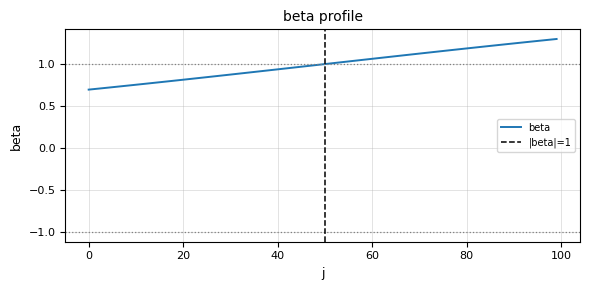

In [233]:
def beta_from_config(j, config):
    L_cfg = config.get("L")
    epsilon_cfg = config.get("epsilon", config.get("l", 2*np.pi) / L_cfg)
    if config.get("surface_gravity_beta", False):
        width = 0.1
        A = 1
        center = int(L_cfg / 2)
        return A * np.tanh(width * (j - center) * epsilon_cfg) + A
    sign = 1 if config.get("beta_sign", "plus") == "plus" else -1
    profile = config.get("beta_profile", "pos")
    if profile in {"pos", "pos_horizon"}:
        amp = config.get("beta_amplitude")
        width = config.get("beta_width")
        center = config.get("beta_center_fraction") * L_cfg
        return sign * amp * (np.tanh(3 / width * (j - center) * epsilon_cfg) + 1)
    if profile in {"center", "centered_horizon"}:
        amp = config.get("centered_beta_amplitude")
        width = config.get("centered_beta_width")
        center = config.get("centered_beta_center_fraction") * L_cfg
        return sign * (amp * np.tanh(width * (j - center) * epsilon_cfg) + amp)
    return np.zeros_like(j, dtype=float)

def compute_horizon_positions_from_config(config, num_samples=10000):
    L_cfg = config.get("L")
    if L_cfg is None:
        return []
    xs = np.linspace(0, L_cfg - 1, num_samples)
    vals = np.abs(beta_from_config(xs, config)) - 1
    positions = []
    for idx in range(len(xs) - 1):
        v0, v1 = vals[idx], vals[idx + 1]
        if v0 == 0:
            positions.append(xs[idx])
        elif v0 * v1 < 0:
            x0, x1 = xs[idx], xs[idx + 1]
            positions.append(x0 - v0 * (x1 - x0) / (v1 - v0))
    if vals[-1] == 0:
        positions.append(xs[-1])
    unique_positions = []
    for position in positions:
        if not unique_positions or abs(position - unique_positions[-1]) > 1e-3:
            unique_positions.append(float(position))
    return unique_positions

def load_horizon_positions(run_dir):
    path = run_dir / "horizon_positions.txt"
    if path.exists():
        data = np.genfromtxt(path, names=True)
        if data.size == 0:
            return []
        data = np.atleast_1d(data)
        return [float(row["j"]) for row in data]
    config = load_json(run_dir / "config.json") or {}
    return compute_horizon_positions_from_config(config)

def load_beta_profile(run_dir):
    path = run_dir / "beta_profile.csv"
    if path.exists():
        data = np.genfromtxt(path, delimiter=",", names=True)
        data = np.atleast_1d(data)
        return np.asarray(data["j"]), np.asarray(data["beta"])
    config = load_json(run_dir / "config.json") or {}
    L_cfg = config.get("L")
    if L_cfg is None:
        return np.array([]), np.array([])
    sites = np.arange(L_cfg)
    return sites, beta_from_config(sites, config)

for run_dir in selected_run_dirs:
    display(Markdown(f"### {run_dir.name}"))
    sites, beta_values = load_beta_profile(run_dir)
    if len(sites) == 0:
        print("beta profile を表示できません。")
        continue
    fig, ax = plt.subplots(figsize=(6, 3), facecolor="white")
    ax.set_facecolor("white")
    ax.plot(sites, beta_values, linewidth=1.4, label="beta")
    ax.axhline(1, color="0.5", linestyle=":", linewidth=0.9)
    ax.axhline(-1, color="0.5", linestyle=":", linewidth=0.9)
    for idx, horizon_j in enumerate(load_horizon_positions(run_dir)):
        ax.axvline(horizon_j, color="black", linestyle="--", linewidth=1.1, label="|beta|=1" if idx == 0 else None)
    ax.set_title("beta profile", fontsize=10)
    ax.set_xlabel("j", fontsize=9)
    ax.set_ylabel("beta", fontsize=9)
    ax.tick_params(labelsize=8)
    ax.grid(True, linewidth=0.5, alpha=0.5)
    ax.legend(fontsize=7, frameon=True)
    plt.tight_layout()
    save_notebook_figure(fig, run_figures_dir(run_dir) / "beta_profile.png")
    plt.show()


## Summary / Config

In [234]:
for run_dir in selected_run_dirs:
    display(Markdown(f"### {run_dir.name}"))
    summary = load_json(run_dir / "summary.json")
    config = load_json(run_dir / "config.json")
    if summary:
        print("summary.json")
        print(json.dumps(summary, indent=2, ensure_ascii=False))
    else:
        print("summary.json がありません。")
    if config:
        print("\nconfig quick view")
        for key in ["scenario", "chirality", "beta_sign", "L", "p", "m", "t_f", "dt", "run_name"]:
            if key in config:
                print(f"{key}: {config[key]}")

### 20260512_185337_BH_chi_minus_L100

summary.json
{
  "run_name": "20260512_185337_BH_chi_minus_L100",
  "output_dir": "outputs/20260512_185337_BH_chi_minus_L100",
  "L": 100,
  "scenario": "BH_chi_minus",
  "chirality": "chi_minus",
  "beta_sign": "plus",
  "beta_profile": "pos_horizon",
  "p": 0.0001,
  "m": 0.0001,
  "t_f": 5,
  "dt": 0.03,
  "H_p_sigma_min_time": 0.03,
  "H_p_sigma_min": -26.89712962677505,
  "H_m_sigma_min_time": 0.03,
  "H_m_sigma_min": 9.10692621943765e-05,
  "t_line_0": null,
  "stagnation_time": null,
  "horizon_positions_j": [
    50.0
  ],
  "horizon_positions_x": [
    3.1415926535897936
  ]
}

config quick view
scenario: BH_chi_minus
chirality: chi_minus
beta_sign: plus
L: 100
p: 0.0001
m: 0.0001
t_f: 5
dt: 0.03
run_name: 20260512_185337_BH_chi_minus_L100


## Time Series Text Outputs

### 20260512_185337_BH_chi_minus_L100

saved: outputs/20260512_185337_BH_chi_minus_L100/figures/x_ave.png


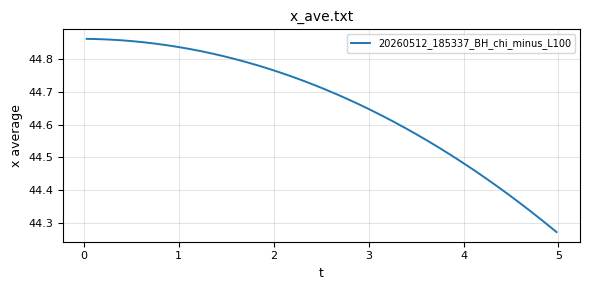

saved: outputs/20260512_185337_BH_chi_minus_L100/figures/H_m_sigmas.png


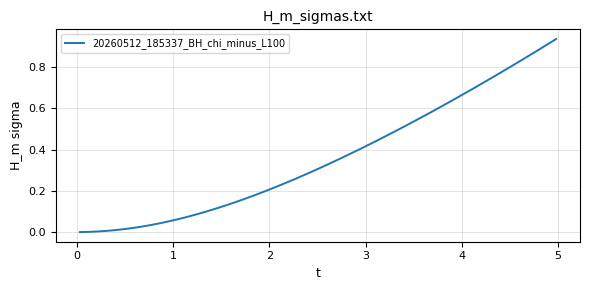

In [235]:
def load_two_column_txt(run_dir, filename):
    path = run_dir / filename
    if not path.exists():
        print(f"skip: {path}")
        return None
    data = np.loadtxt(path)
    if data.ndim == 1:
        data = data.reshape(1, -1)
    return data


def plot_two_column_txt(run_dir, filename, ylabel):
    data = load_two_column_txt(run_dir, filename)
    if data is None:
        return
    fig, ax = plt.subplots(figsize=(6, 3), facecolor="white")
    ax.set_facecolor("white")
    ax.plot(data[:, 0], data[:, 1], label=run_dir.name, linewidth=1.4)
    ax.set_xlabel("t", fontsize=9)
    ax.set_ylabel(ylabel, fontsize=9)
    ax.set_title(filename, fontsize=10)
    ax.grid(True, linewidth=0.5, alpha=0.5)
    ax.tick_params(labelsize=8)
    ax.legend(fontsize=7, loc="best", frameon=True)
    plt.tight_layout()
    save_notebook_figure(fig, run_figures_dir(run_dir) / f"{Path(filename).stem}.png")
    plt.show()

for run_dir in selected_run_dirs:
    display(Markdown(f"### {run_dir.name}"))
    for filename, ylabel in [("x_ave.txt", "x average"), ("H_m_sigmas.txt", "H_m sigma")]:
        plot_two_column_txt(run_dir, filename, ylabel)


## Surface Gravity Fit

保存済み `H_m_sigmas.txt` から、ノートブック上で任意の時間範囲を選んで指数 fit します。数値計算本体は従来通り全範囲で fit します。

### 20260512_185337_BH_chi_minus_L100

Fitted function: H_m_sigma(t) = A * exp(B t) - A
20260512_185337_BH_chi_minus_L100: A=0.000497657, B=2.13768, range=(0, 1)
Reference curve: A_ref=1, B_ref=|d beta/dx|=0.0999999 at horizon j=50
Relative error |B_fit - B_ref| / |B_ref| = 2037.683082%
saved: outputs/20260512_185337_BH_chi_minus_L100/figures/surface_gravity_fit.png


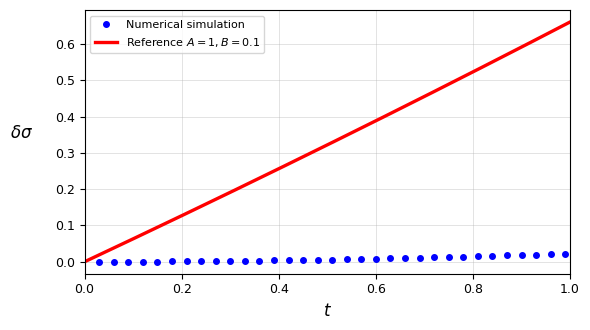

In [236]:
SURFACE_GRAVITY_FIT_RANGE = (0.0, 1.0)
# 表示と fit は既定で 0 <= t <= 1 です。全範囲で再 fit したい場合は SURFACE_GRAVITY_FIT_RANGE = None。


def sigma_growth_model(t, amplitude, growth_rate):
    """Model used in surface_gravity.py: A * exp(B t) - A."""
    return amplitude * np.exp(growth_rate * t) - amplitude


def beta_derivative_at_j(config, j_position):
    """Return d beta / dx at a lattice-index position using a centered finite difference."""
    L_cfg = config.get("L")
    if L_cfg is None:
        return None
    epsilon = config.get("epsilon", config.get("l", 2*np.pi) / L_cfg)
    step_j = max(1e-3, 0.25)
    j_left = max(0, j_position - step_j)
    j_right = min(L_cfg - 1, j_position + step_j)
    if j_right == j_left:
        return None
    beta_left = beta_from_config(j_left, config)
    beta_right = beta_from_config(j_right, config)
    return float((beta_right - beta_left) / ((j_right - j_left) * epsilon))


def ideal_surface_gravity(run_dir):
    """Compute kappa = |d beta / dx| at the configured horizon position."""
    config = load_json(run_dir / "config.json") or {}
    horizon_positions = load_horizon_positions(run_dir)
    if not horizon_positions:
        return None, None

    chirality = config.get("chirality")
    target_beta = None
    if chirality == "chi_plus":
        target_beta = -1
    elif chirality == "chi_minus":
        target_beta = 1

    if target_beta is None:
        selected_horizon = horizon_positions[0]
    else:
        selected_horizon = min(
            horizon_positions,
            key=lambda j: abs(float(beta_from_config(j, config)) - target_beta),
        )

    beta_prime = beta_derivative_at_j(config, selected_horizon)
    if beta_prime is None:
        return None, selected_horizon
    return abs(beta_prime), selected_horizon


def load_sigma_data(run_dir):
    path = run_dir / "H_m_sigmas.txt"
    if not path.exists():
        print(f"skip: {path}")
        return None, None, None
    data = np.loadtxt(path)
    if data.ndim == 1:
        data = data.reshape(1, -1)
    config = load_json(run_dir / "config.json") or {}
    lattice_spacing = config.get("epsilon", config.get("l", 2*np.pi) / config.get("L", 1))
    system_length = config.get("l", 2*np.pi)
    times = data[:, 0]
    sigma_delta = data[:, 1] * lattice_spacing
    return times, sigma_delta, system_length, config


def select_fit_window(times, values, fit_range):
    if fit_range is None:
        return times, values, float(times.min()), float(times.max())
    t_min, t_max = fit_range
    mask = (times >= t_min) & (times <= t_max)
    return times[mask], values[mask], t_min, t_max



def reference_surface_gravity_amplitude(config, system_length):
    """Use A=1 for the ideal curve so it is independent of p."""
    return 1.0

def fit_surface_gravity_from_txt(run_dir, fit_range=(0.0, 1.0)):
    times, sigma_delta, system_length, config = load_sigma_data(run_dir)
    if times is None:
        return

    fit_times, fit_values, t_min, t_max = select_fit_window(times, sigma_delta, fit_range)
    if len(fit_times) < 2:
        print(f"fit skipped: {run_dir.name}: selected range has fewer than 2 points")
        return

    initial_amplitude = fit_values[0] if fit_values[0] != 0 else 1e-12
    try:
        (amplitude, growth_rate), _ = curve_fit(
            sigma_growth_model,
            fit_times,
            fit_values,
            p0=[initial_amplitude, 1.0],
            maxfev=10000,
        )
    except (RuntimeError, ValueError) as exc:
        print(f"fit failed: {run_dir.name}: {exc}")
        return

    reference_growth_rate, horizon_j = ideal_surface_gravity(run_dir)
    print("Fitted function: H_m_sigma(t) = A * exp(B t) - A")
    print(f"{run_dir.name}: A={amplitude:.6g}, B={growth_rate:.6g}, range=({t_min:.6g}, {t_max:.6g})")
    if reference_growth_rate is None:
        relative_error = None
        print("Reference B skipped: horizon position or beta derivative could not be computed")
    else:
        relative_error = abs(growth_rate - reference_growth_rate) / abs(reference_growth_rate)
        print(f"Reference curve: A_ref=1, B_ref=|d beta/dx|={reference_growth_rate:.6g} at horizon j={horizon_j:.6g}")
        print(f"Relative error |B_fit - B_ref| / |B_ref| = {relative_error:.6%}")

    t_fine = np.linspace(t_min, t_max, 2000)
    fig, ax = plt.subplots(figsize=(6, 3.4), facecolor="white")
    ax.set_facecolor("white")
    ax.plot(fit_times, fit_values * system_length, "o", label="Numerical simulation", color="blue", ms=4)
    reference_amplitude = reference_surface_gravity_amplitude(config, system_length)
    if reference_growth_rate is not None and reference_amplitude is not None:
        reference_curve = sigma_growth_model(t_fine, reference_amplitude, reference_growth_rate)
        ax.plot(t_fine, reference_curve * system_length, label=fr"Reference $A=1, B={reference_growth_rate:.3g}$", color="red", lw=2.4)
    ax.set_xlim(t_min, t_max)
    ax.set_xlabel(r"$t$", fontsize=12, fontweight="bold")
    ax.set_ylabel(r"$\delta \sigma$", fontsize=12, fontweight="bold", rotation=0, labelpad=24)
    ax.tick_params(labelsize=9)
    ax.grid(True, linewidth=0.5, alpha=0.5)
    ax.legend(fontsize=8, frameon=True)
    plt.tight_layout()
    save_notebook_figure(fig, run_figures_dir(run_dir) / "surface_gravity_fit.png")
    plt.show()

for run_dir in selected_run_dirs:
    display(Markdown(f"### {run_dir.name}"))
    fit_surface_gravity_from_txt(run_dir, SURFACE_GRAVITY_FIT_RANGE)


## CSV Heatmap Data

`*_val.csv` がある場合、CSV から heatmap を再描画します。

### 20260512_185337_BH_chi_minus_L100

saved: outputs/20260512_185337_BH_chi_minus_L100/figures/H_p.png


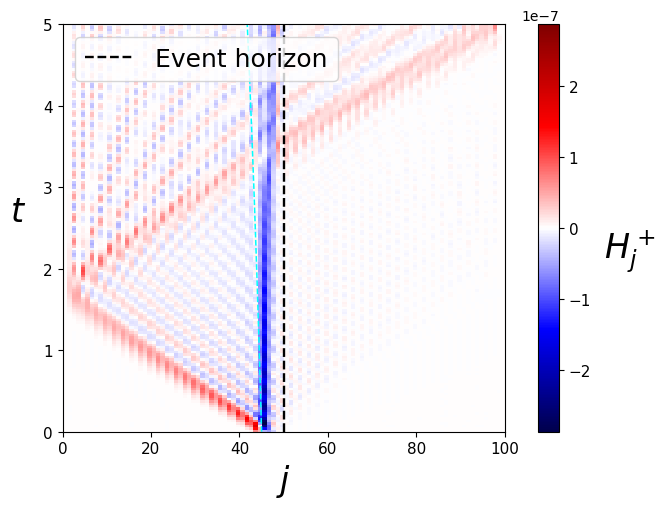

saved: outputs/20260512_185337_BH_chi_minus_L100/figures/H_p.gif


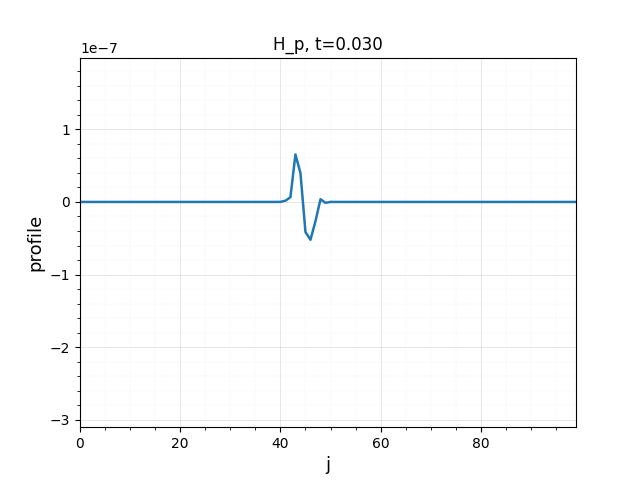

saved: outputs/20260512_185337_BH_chi_minus_L100/figures/H_m.png


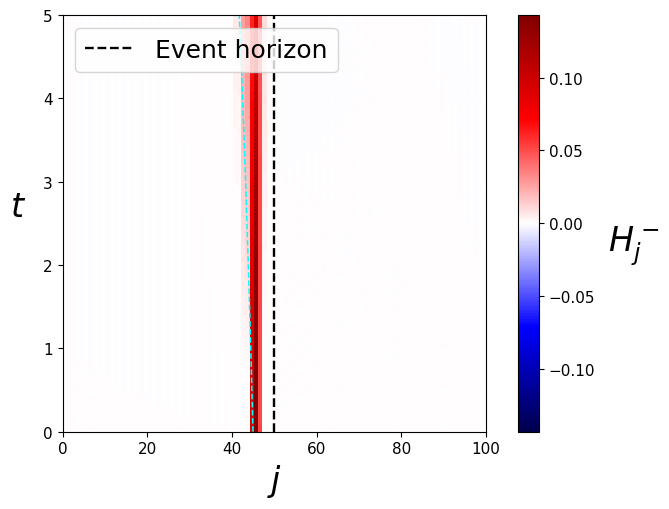

saved: outputs/20260512_185337_BH_chi_minus_L100/figures/H_m.gif


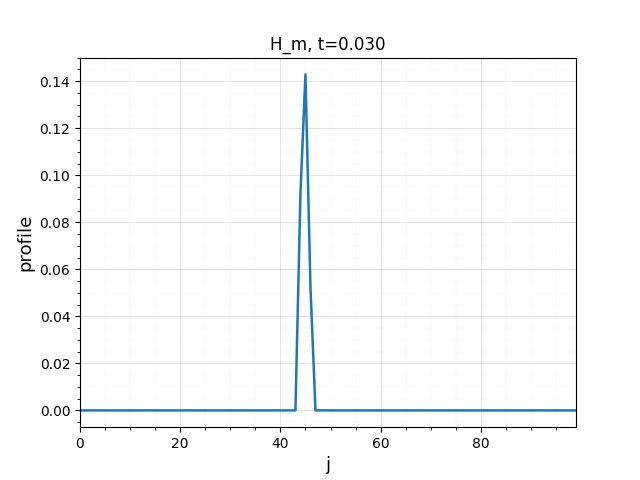

saved: outputs/20260512_185337_BH_chi_minus_L100/figures/H_pm.png


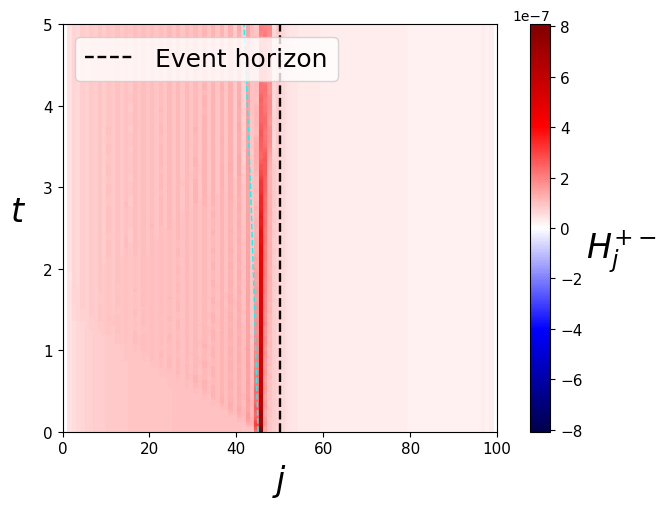

saved: outputs/20260512_185337_BH_chi_minus_L100/figures/H_pm.gif


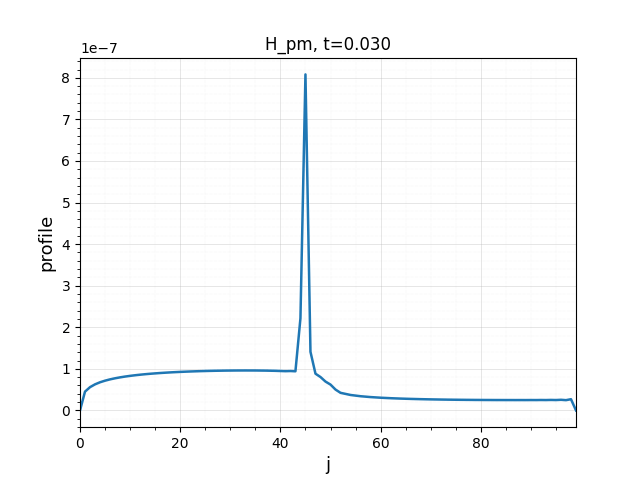

saved: outputs/20260512_185337_BH_chi_minus_L100/figures/c_dag_c.png


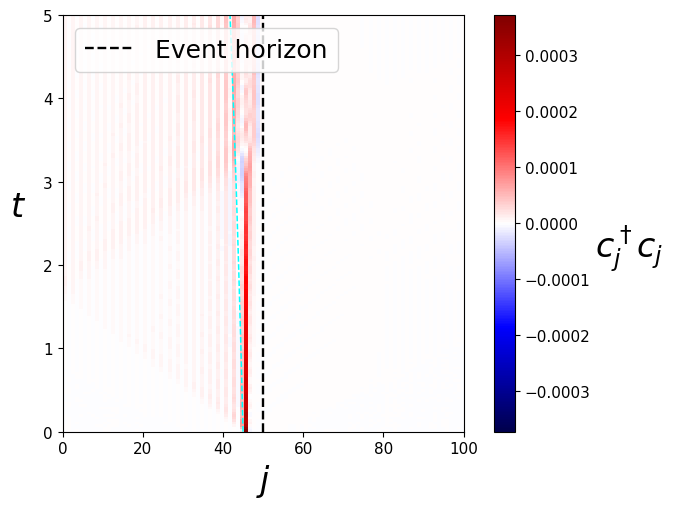

saved: outputs/20260512_185337_BH_chi_minus_L100/figures/c_dag_c.gif


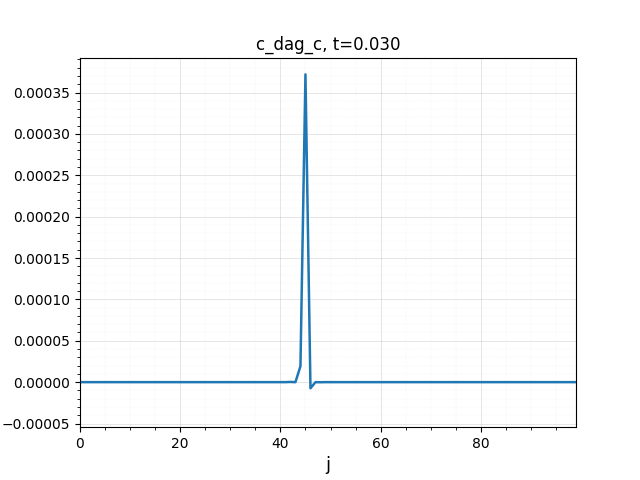

In [237]:
def load_time_site_csv(path):
    data = np.genfromtxt(path, delimiter=",", names=True)
    if data.shape == ():
        data = data.reshape(1)
    times = np.asarray(data["time"])
    site_names = [name for name in data.dtype.names if name != "time"]
    values = np.column_stack([data[name] for name in site_names])
    return times, values

COLORBAR_LABELS = {
    "H_p_val": r"$H_j^+$",
    "H_m_val": r"$H_j^-$",
    "H_pm_val": r"$H_j^{+-}$",
    "c_dag_c_val": r"$c_j^\dagger c_j$",
}

def display_time_site_slider(run_dir, name, times, values):
    """Display a slider for real-space time evolution profiles."""
    values = np.asarray(values, dtype=float)
    max_abs = float(np.nanmax(np.abs(values)))
    if not np.isfinite(max_abs) or max_abs == 0:
        max_abs = 1.0
    payload = {
        "times": times.tolist(),
        "values": (values / max_abs).tolist(),
        "maxAbs": max_abs,
        "name": name,
    }
    encoded = base64.b64encode(json.dumps(payload).encode("utf-8")).decode("ascii")
    element_id = f"profile-slider-{run_dir.name}-{name}".replace(".", "-").replace("_", "-")
    html = f"""
<div id="{element_id}" style="max-width:760px;font-family:Arial,sans-serif;margin:8px 0 18px 0;">
  <canvas width="720" height="360" style="width:100%;border:1px solid #ddd;background:white;"></canvas>
  <div style="display:flex;align-items:center;gap:10px;margin-top:6px;">
    <input type="range" min="0" max="0" value="0" step="1" style="flex:1;">
    <span style="font-size:12px;min-width:120px;"></span>
  </div>
</div>
<script>
(() => {{
  const data = JSON.parse(atob("{encoded}"));
  const root = document.getElementById("{element_id}");
  const canvas = root.querySelector("canvas");
  const ctx = canvas.getContext("2d");
  const slider = root.querySelector("input");
  const label = root.querySelector("span");
  slider.max = data.times.length - 1;
  const margin = {{left:58, right:18, top:24, bottom:44}};
  const width = canvas.width - margin.left - margin.right;
  const height = canvas.height - margin.top - margin.bottom;
  const numSites = data.values[0].length;
  function xScale(j) {{ return margin.left + (j / Math.max(1, numSites - 1)) * width; }}
  function yScale(v) {{ return margin.top + (1 - (v + 1) / 2) * height; }}
  function drawGrid() {{
    ctx.strokeStyle = "rgba(0,0,0,0.18)";
    ctx.lineWidth = 1;
    ctx.font = "11px Arial";
    ctx.fillStyle = "#333";
    ctx.textAlign = "center";
    ctx.textBaseline = "top";
    const major = 10;
    for (let i = 0; i <= major; i++) {{
      const j = (numSites - 1) * i / major;
      const x = xScale(j);
      ctx.beginPath(); ctx.moveTo(x, margin.top); ctx.lineTo(x, margin.top + height); ctx.stroke();
      ctx.fillText(Math.round(j).toString(), x, margin.top + height + 8);
    }}
    ctx.strokeStyle = "rgba(0,0,0,0.10)";
    for (let i = 0; i <= 4; i++) {{
      const v = -1 + 0.5 * i;
      const y = yScale(v);
      ctx.beginPath(); ctx.moveTo(margin.left, y); ctx.lineTo(margin.left + width, y); ctx.stroke();
    }}
    ctx.strokeStyle = "#333";
    ctx.beginPath();
    ctx.moveTo(margin.left, margin.top);
    ctx.lineTo(margin.left, margin.top + height);
    ctx.lineTo(margin.left + width, margin.top + height);
    ctx.stroke();
    ctx.fillText("j", margin.left + width / 2, canvas.height - 16);
    ctx.save();
    ctx.translate(16, margin.top + height / 2);
    ctx.rotate(-Math.PI / 2);
    ctx.textAlign = "center";
    ctx.fillText("profile (normalized)", 0, 0);
    ctx.restore();
  }}
  function draw(frame) {{
    const values = data.values[frame];
    ctx.clearRect(0, 0, canvas.width, canvas.height);
    drawGrid();
    ctx.strokeStyle = "#1f77b4";
    ctx.lineWidth = 2;
    ctx.beginPath();
    for (let j = 0; j < values.length; j++) {{
      const x = xScale(j);
      const y = yScale(values[j]);
      if (j === 0) ctx.moveTo(x, y); else ctx.lineTo(x, y);
    }}
    ctx.stroke();
    const peakIndex = values.reduce((best, v, i) => Math.abs(v) > Math.abs(values[best]) ? i : best, 0);
    ctx.strokeStyle = "#d62728";
    ctx.setLineDash([4, 4]);
    ctx.beginPath(); ctx.moveTo(xScale(peakIndex), margin.top); ctx.lineTo(xScale(peakIndex), margin.top + height); ctx.stroke();
    ctx.setLineDash([]);
    ctx.fillStyle = "#111";
    ctx.textAlign = "left";
    ctx.textBaseline = "top";
    ctx.font = "13px Arial";
    ctx.fillText(`${{data.name}}  t=${{data.times[frame].toFixed(3)}}  peak j=${{peakIndex}}`, margin.left, 4);
    label.textContent = `frame ${{frame + 1}}/${{data.times.length}}`;
  }}
  slider.addEventListener("input", () => draw(Number(slider.value)));
  draw(0);
}})();
</script>
"""
    display(HTML(html))

def save_time_site_gif(run_dir, name, times, values, fps=20):
    """Save a real-space time-evolution GIF from CSV data."""
    values = np.asarray(values, dtype=float)
    gif_path = run_figures_dir(run_dir) / f"{name}.gif"
    y_min = float(np.nanmin(values))
    y_max = float(np.nanmax(values))
    if not np.isfinite(y_min) or not np.isfinite(y_max) or y_min == y_max:
        y_min, y_max = -1.0, 1.0
    pad = 0.05 * (y_max - y_min)

    fig, ax = plt.subplots(figsize=(6.4, 4.8), facecolor="white")
    ax.set_facecolor("white")
    sites = np.arange(values.shape[1])
    line, = ax.plot([], [], lw=1.8, color="#1f77b4")
    title = ax.set_title("")
    ax.set_xlim(0, values.shape[1] - 1)
    ax.set_ylim(y_min - pad, y_max + pad)
    ax.set_xlabel("j", fontsize=13)
    ax.set_ylabel("profile", fontsize=13)
    ax.grid(True, which="major", linestyle="-", linewidth=0.5, alpha=0.45)
    ax.grid(True, which="minor", linestyle=":", linewidth=0.35, alpha=0.25)
    ax.minorticks_on()

    def init():
        line.set_data([], [])
        title.set_text("")
        return (line, title)

    def update(frame):
        line.set_data(sites, values[frame])
        title.set_text(f"{name}, t={times[frame]:.3f}")
        return (line, title)

    animation = FuncAnimation(
        fig,
        update,
        frames=len(times),
        init_func=init,
        blit=True,
        interval=1000 / fps,
    )
    animation.save(gif_path, writer=PillowWriter(fps=fps))
    plt.close(fig)
    print(f"saved: {gif_path}")
    return gif_path

def plot_time_site_heatmap(run_dir, path):
    times, values = load_time_site_csv(path)
    config = load_json(run_dir / "config.json") or {}
    t_min = config.get("t_i", float(times[0]))
    t_max = config.get("t_f", float(times[-1]))
    color_limit = float(np.nanmax(np.abs(values)))
    if not np.isfinite(color_limit) or color_limit == 0:
        color_limit = 1.0
    fig, ax = plt.subplots(figsize=(6.8, 5.2), facecolor="white")
    ax.set_facecolor("white")
    im = ax.imshow(
        values,
        aspect="auto",
        origin="lower",
        extent=[0, values.shape[1], t_min, t_max],
        cmap="seismic",
        vmin=-color_limit,
        vmax=color_limit,
        interpolation="nearest",
    )
    horizon_positions = load_horizon_positions(run_dir)
    for idx, horizon_j in enumerate(horizon_positions):
        ax.axvline(horizon_j, color="black", linestyle="--", linewidth=1.7, label="Event horizon" if idx == 0 else None)
    geodesic_path = run_dir / "geodesic.dat"
    if geodesic_path.exists():
        geodesic = np.loadtxt(geodesic_path, delimiter=",")
        if geodesic.ndim == 1:
            geodesic = geodesic.reshape(1, -1)
        x_scaled = (geodesic[:, 0] / (2 * np.pi)) * values.shape[1]
        ax.plot(x_scaled, geodesic[:, 1], color="cyan", linestyle="--", linewidth=1.1)
    ax.set_xlim(0, values.shape[1])
    ax.set_ylim(t_min, t_max)
    ax.set_xlabel(r"$j$", fontsize=24, fontweight="bold")
    ax.set_ylabel(r"$t$", fontsize=24, fontweight="bold", rotation=0, labelpad=18)
    ax.tick_params(labelsize=11)
    if horizon_positions:
        ax.legend(loc="upper left", fontsize=18, frameon=True)
    cbar = fig.colorbar(im, ax=ax, location="right", pad=0.06)
    cbar.ax.tick_params(labelsize=11)
    cbar.set_label(COLORBAR_LABELS.get(path.stem, path.stem), rotation=0, labelpad=28, fontsize=24)
    plt.tight_layout()
    save_notebook_figure(fig, run_figures_dir(run_dir) / f"{path.stem.removesuffix('_val')}.png")
    plt.show()
    gif_path = save_time_site_gif(run_dir, path.stem.removesuffix("_val"), times, values)
    display(Image(filename=str(gif_path)))
    display_time_site_slider(run_dir, path.stem.removesuffix("_val"), times, values)

for run_dir in selected_run_dirs:
    display(Markdown(f"### {run_dir.name}"))
    csv_files = [run_dir / name for name in ["H_p_val.csv", "H_m_val.csv", "H_pm_val.csv", "c_dag_c_val.csv"]]
    csv_files = [p for p in csv_files if p.exists()]
    if not csv_files:
        print("*_val.csv がありません。新しい simulation.py で再実行すると保存されます。")
        continue
    for path in csv_files:
        plot_time_site_heatmap(run_dir, path)


## FFT Spectra

`*_fft_val.csv` と `*_fft_k.csv` がある場合、各時刻の FFT 振幅をカラーマップで表示し、保存済み GIF も表示します。

### 20260512_185337_BH_chi_minus_L100

saved: outputs/20260512_185337_BH_chi_minus_L100/figures/H_p_fft.png


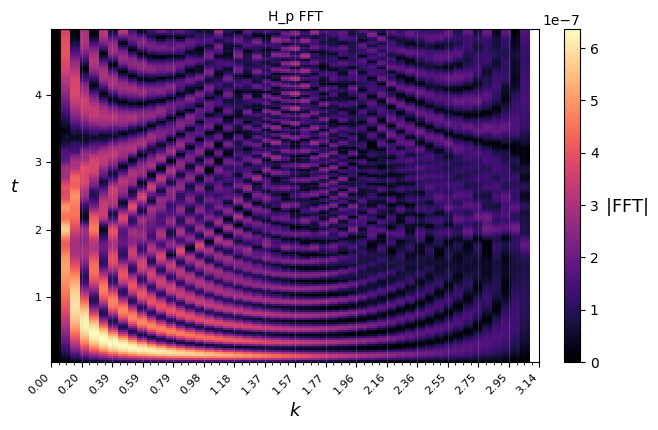

saved: outputs/20260512_185337_BH_chi_minus_L100/figures/H_p_fft.gif


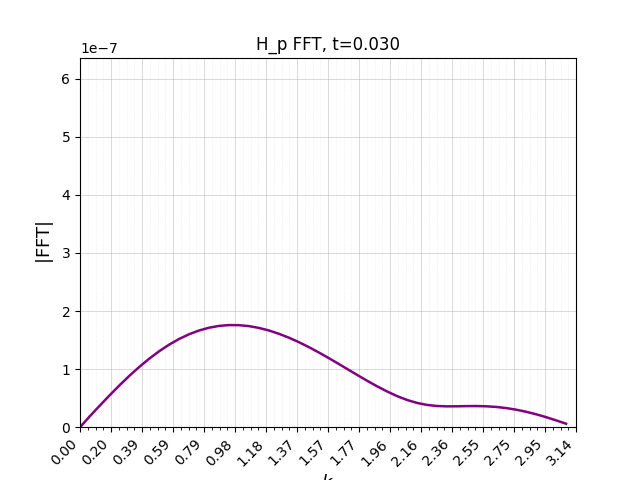

In [238]:
def load_fft_csv(run_dir, stem):
    spectrum_path = run_dir / f"{stem}_fft_val.csv"
    k_path = run_dir / f"{stem}_fft_k.csv"
    if not spectrum_path.exists() or not k_path.exists():
        return None, None, None
    data = np.genfromtxt(spectrum_path, delimiter=",", names=True)
    if data.shape == ():
        data = data.reshape(1)
    times = np.asarray(data["time"])
    names = [name for name in data.dtype.names if name != "time"]
    spectrum = np.column_stack([data[name] for name in names])
    k_values = np.loadtxt(k_path, delimiter=",", skiprows=1)
    positive_k = k_values >= 0
    return times, k_values[positive_k], spectrum[:, positive_k]


def configure_fft_k_axis(ax, k_values):
    ax.set_xlim(0, k_values[-1])
    major_ticks = np.linspace(0, np.pi, 17)
    minor_ticks = np.linspace(0, np.pi, 65)
    ax.set_xticks(major_ticks)
    ax.set_xticks(minor_ticks, minor=True)
    ax.set_xticklabels([f"{tick:.2f}" for tick in major_ticks], rotation=45, ha="right")
    ax.grid(True, which="major", axis="x", linestyle="-", linewidth=0.5, alpha=0.35)
    ax.grid(True, which="minor", axis="x", linestyle=":", linewidth=0.4, alpha=0.25)


def save_fft_gif(run_dir, stem, times, k_values, spectrum, fps=20):
    gif_path = run_figures_dir(run_dir) / f"{stem}_fft.gif"
    y_max = float(np.nanmax(spectrum))
    if not np.isfinite(y_max) or y_max == 0:
        y_max = 1.0

    fig, ax = plt.subplots(figsize=(6.4, 4.8), facecolor="white")
    ax.set_facecolor("white")
    line, = ax.plot([], [], lw=1.8, color="purple")
    title = ax.set_title("")
    ax.set_ylim(0, y_max)
    ax.set_xlabel(r"$k$", fontsize=13)
    ax.set_ylabel(r"$|\mathrm{FFT}|$", fontsize=13)
    configure_fft_k_axis(ax, k_values)
    ax.grid(True, which="major", linestyle="-", linewidth=0.6, alpha=0.55)
    ax.grid(True, which="minor", linestyle=":", linewidth=0.45, alpha=0.35)

    def init():
        line.set_data([], [])
        title.set_text("")
        return (line, title)

    def update(frame):
        line.set_data(k_values, spectrum[frame])
        title.set_text(f"{stem} FFT, t={times[frame]:.3f}")
        return (line, title)

    animation = FuncAnimation(
        fig,
        update,
        frames=len(times),
        init_func=init,
        blit=True,
        interval=1000 / fps,
    )
    animation.save(gif_path, writer=PillowWriter(fps=fps))
    plt.close(fig)
    print(f"saved: {gif_path}")
    return gif_path


def display_fft_slider(run_dir, stem, times, k_values, spectrum):
    """Display a lightweight HTML slider for FFT frames without ipywidgets."""
    max_value = float(np.nanmax(spectrum))
    if not np.isfinite(max_value) or max_value == 0:
        max_value = 1.0
    payload = {
        "times": times.tolist(),
        "k": k_values.tolist(),
        "spectrum": (spectrum / max_value).tolist(),
        "maxValue": max_value,
        "stem": stem,
    }
    encoded = base64.b64encode(json.dumps(payload).encode("utf-8")).decode("ascii")
    element_id = f"fft-slider-{run_dir.name}-{stem}".replace(".", "-").replace("_", "-")
    html = f"""
<div id="{element_id}" style="max-width:760px;font-family:Arial,sans-serif;margin:8px 0 18px 0;">
  <canvas width="720" height="360" style="width:100%;border:1px solid #ddd;background:white;"></canvas>
  <div style="display:flex;align-items:center;gap:10px;margin-top:6px;">
    <input type="range" min="0" max="0" value="0" step="1" style="flex:1;">
    <span style="font-size:12px;min-width:120px;"></span>
  </div>
</div>
<script>
(() => {{
  const data = JSON.parse(atob("{encoded}"));
  const root = document.getElementById("{element_id}");
  const canvas = root.querySelector("canvas");
  const ctx = canvas.getContext("2d");
  const slider = root.querySelector("input");
  const label = root.querySelector("span");
  slider.max = data.times.length - 1;
  const margin = {{left:54, right:18, top:24, bottom:48}};
  const width = canvas.width - margin.left - margin.right;
  const height = canvas.height - margin.top - margin.bottom;
  const kMax = Math.PI;
  function xScale(k) {{ return margin.left + (k / kMax) * width; }}
  function yScale(v) {{ return margin.top + height - v * height; }}
  function drawGrid() {{
    ctx.strokeStyle = "rgba(0,0,0,0.20)";
    ctx.lineWidth = 1;
    ctx.font = "11px Arial";
    ctx.fillStyle = "#333";
    ctx.textAlign = "center";
    ctx.textBaseline = "top";
    for (let i = 0; i <= 16; i++) {{
      const k = Math.PI * i / 16;
      const x = xScale(k);
      ctx.beginPath(); ctx.moveTo(x, margin.top); ctx.lineTo(x, margin.top + height); ctx.stroke();
      ctx.fillText(k.toFixed(2), x, margin.top + height + 8);
    }}
    ctx.strokeStyle = "rgba(0,0,0,0.10)";
    for (let i = 0; i <= 64; i++) {{
      const k = Math.PI * i / 64;
      const x = xScale(k);
      ctx.beginPath(); ctx.moveTo(x, margin.top); ctx.lineTo(x, margin.top + height); ctx.stroke();
    }}
    ctx.strokeStyle = "#333";
    ctx.beginPath();
    ctx.moveTo(margin.left, margin.top);
    ctx.lineTo(margin.left, margin.top + height);
    ctx.lineTo(margin.left + width, margin.top + height);
    ctx.stroke();
    ctx.save();
    ctx.translate(16, margin.top + height / 2);
    ctx.rotate(-Math.PI / 2);
    ctx.textAlign = "center";
    ctx.fillText("|FFT| (normalized)", 0, 0);
    ctx.restore();
    ctx.fillText("k", margin.left + width / 2, canvas.height - 16);
  }}
  function draw(frame) {{
    const values = data.spectrum[frame];
    ctx.clearRect(0, 0, canvas.width, canvas.height);
    drawGrid();
    ctx.strokeStyle = "purple";
    ctx.lineWidth = 2;
    ctx.beginPath();
    for (let i = 0; i < data.k.length; i++) {{
      const x = xScale(data.k[i]);
      const y = yScale(values[i]);
      if (i === 0) ctx.moveTo(x, y); else ctx.lineTo(x, y);
    }}
    ctx.stroke();
    const peakIndex = values.reduce((best, v, i) => v > values[best] ? i : best, 0);
    const peakK = data.k[peakIndex];
    ctx.strokeStyle = "#d62728";
    ctx.setLineDash([4, 4]);
    ctx.beginPath(); ctx.moveTo(xScale(peakK), margin.top); ctx.lineTo(xScale(peakK), margin.top + height); ctx.stroke();
    ctx.setLineDash([]);
    ctx.fillStyle = "#111";
    ctx.textAlign = "left";
    ctx.textBaseline = "top";
    ctx.font = "13px Arial";
    ctx.fillText(`${{data.stem}} FFT  t=${{data.times[frame].toFixed(3)}}  peak k=${{peakK.toFixed(4)}}`, margin.left, 4);
    label.textContent = `frame ${{frame + 1}}/${{data.times.length}}`;
  }}
  slider.addEventListener("input", () => draw(Number(slider.value)));
  draw(0);
}})();
</script>
"""
    display(HTML(html))

def plot_fft_heatmap(run_dir, stem):
    times, k_values, spectrum = load_fft_csv(run_dir, stem)
    if times is None:
        return False
    color_limit = float(np.nanmax(spectrum))
    if not np.isfinite(color_limit) or color_limit == 0:
        color_limit = 1.0
    fig, ax = plt.subplots(figsize=(6.8, 4.4), facecolor="white")
    ax.set_facecolor("white")
    im = ax.imshow(
        spectrum,
        aspect="auto",
        origin="lower",
        extent=[0, k_values[-1], times[0], times[-1]],
        cmap="magma",
        vmin=0,
        vmax=color_limit,
        interpolation="nearest",
    )
    ax.set_title(f"{stem} FFT", fontsize=10)
    ax.set_xlabel(r"$k$", fontsize=13)
    ax.set_ylabel(r"$t$", fontsize=13, rotation=0, labelpad=14)
    configure_fft_k_axis(ax, k_values)
    ax.tick_params(labelsize=8)
    cbar = fig.colorbar(im, ax=ax, location="right", pad=0.04)
    cbar.set_label(r"$|\mathrm{FFT}|$", rotation=0, labelpad=20, fontsize=13)
    plt.tight_layout()
    save_notebook_figure(fig, run_figures_dir(run_dir) / f"{stem}_fft.png")
    plt.show()

    gif_path = save_fft_gif(run_dir, stem, times, k_values, spectrum)
    display(Image(filename=str(gif_path)))
    return True

for run_dir in selected_run_dirs:
    display(Markdown(f"### {run_dir.name}"))
    stems = sorted(path.name[:-len("_fft_val.csv")] for path in run_dir.glob("*_fft_val.csv"))
    if not stems:
        print("FFT 出力がありません。config の outputs.fft を true にして simulation.py を再実行してください。")
        continue
    for stem in stems:
        plot_fft_heatmap(run_dir, stem)


## Additional Data Plots

保存済み画像は読み込まず、`geodesic.dat` と初期 profile CSV から再プロットします。

### 20260512_185337_BH_chi_minus_L100

saved: outputs/20260512_185337_BH_chi_minus_L100/figures/initial_profiles.png


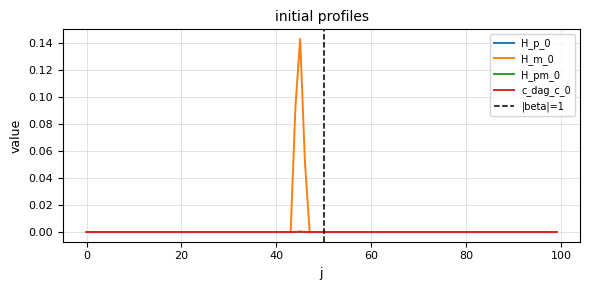

saved: outputs/20260512_185337_BH_chi_minus_L100/figures/geodesic.png


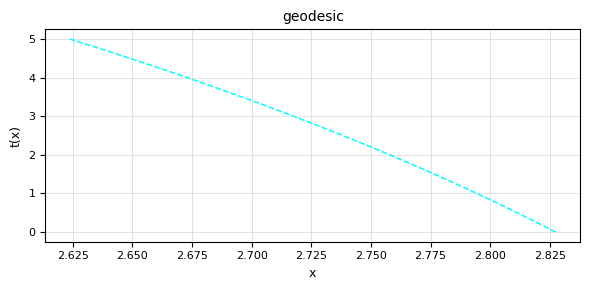

In [239]:
def plot_initial_profiles(run_dir):
    files = [run_dir / name for name in ["H_p_0.csv", "H_m_0.csv", "H_pm_0.csv", "c_dag_c_0.csv"]]
    files = [p for p in files if p.exists()]
    if not files:
        print("初期 profile CSV がありません。")
        return
    fig, ax = plt.subplots(figsize=(6, 3), facecolor="white")
    ax.set_facecolor("white")
    for path in files:
        data = np.genfromtxt(path, delimiter=",", names=True)
        if data.shape == ():
            data = data.reshape(1)
        ax.plot(data["j"], data["value"], label=path.stem, linewidth=1.4)
    for idx, horizon_j in enumerate(load_horizon_positions(run_dir)):
        ax.axvline(horizon_j, color="black", linestyle="--", linewidth=1.1, label="|beta|=1" if idx == 0 else None)
    ax.set_title("initial profiles", fontsize=10)
    ax.set_xlabel("j", fontsize=9)
    ax.set_ylabel("value", fontsize=9)
    ax.tick_params(labelsize=8)
    ax.grid(True, linewidth=0.5, alpha=0.5)
    ax.legend(fontsize=7, frameon=True)
    plt.tight_layout()
    save_notebook_figure(fig, run_figures_dir(run_dir) / "initial_profiles.png")
    plt.show()

def plot_geodesic(run_dir):
    path = run_dir / "geodesic.dat"
    if not path.exists():
        print("geodesic.dat がありません。")
        return
    data = np.loadtxt(path, delimiter=",")
    if data.ndim == 1:
        data = data.reshape(1, -1)
    fig, ax = plt.subplots(figsize=(6, 3), facecolor="white")
    ax.set_facecolor("white")
    ax.plot(data[:, 0], data[:, 1], color="cyan", linestyle="--", linewidth=1.1)
    ax.set_title("geodesic", fontsize=10)
    ax.set_xlabel("x", fontsize=9)
    ax.set_ylabel("t(x)", fontsize=9)
    ax.tick_params(labelsize=8)
    ax.grid(True, linewidth=0.5, alpha=0.5)
    plt.tight_layout()
    save_notebook_figure(fig, run_figures_dir(run_dir) / "geodesic.png")
    plt.show()

for run_dir in selected_run_dirs:
    display(Markdown(f"### {run_dir.name}"))
    plot_initial_profiles(run_dir)
    plot_geodesic(run_dir)